<a href="https://colab.research.google.com/github/A01794025/Actividades_Curso_IBM_David_Gonzalez/blob/main/Equipo06_semana06y07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

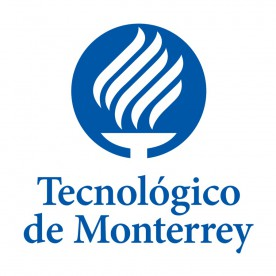

# **Maestría en Inteligencia Artificial Aplicada**
## **Curso: Inteligencia Artificial y Aprendizaje Automático**
### Tecnológico de Monterrey
### Prof. Luis Eduardo Falcón Morales

## **Actividad Semana 6**
### **Modelado de Tópicos - LSI/LDA**

Fernando Maytorena Espinosa de los Monteros | A01110946

Jonathan Garza Bennet | A01793038

Ernesto Enríquez Rubio | A01228409

David Andrés González Medina | A01794025

Helmy Andrea Moreno Navarro | A01793918

#**Introducción**




> Un corpus en cualquier contexto es una fuente muy importante a la hora de encontrar contextos y desarrollar ideas claras. Es por ello, que siempre buscará ser consecuente y poco repetitivo para lograr traducir una idea completa y transmitirla.

>   Con lo anterior y para el presente ejercicio en un modelo no supervisado buscamos mediante técnicas de factorización y modelados probabilísticos en el archivo dado ***noticiasTopicModeling.txt*** hacer uso de los  métodos **LSI** (Indexación Semántica Latente) / **LDA** (Asignación de Dirchlet Latente) con la finalidad de encontrar, otras maneras posibles tokens que estén relacionados entre sí sin que ellos se repitan y que formen un conjunto coherentes entre ellos.

> Inicialmente, se hará una limpieza del archivo y se aplicará un procesamiento normalizando los textos a minúsculas a través del método ***lower*** para estandarizar los documentos. A continuación, se aplicará **REGEX** para limpiar las cadenas de números y espacios. También tokenizaremos y elimninaremos los **stopwords** almacenados en la librería predeterminada de **NLTK** en español.Finalmente, para el presente ejercicio se trabajarán con palabras mayores a 4 caracteres.


##**Objetivo**

*   Identificar los **tokens** que describan mejor la distribución de cada tema.
*   Identificar palabras clave que se empiezan a relacionar en cualquier tipo de aplicación.
*   Relacionar Key word en un contexto o cualquier tema en que se encuentren.

# **Preparación**

### **Dependencias**

In [ ]:
import os

In [ ]:
!pip install pandas


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install numpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%%capture
!pip install nltk
!pip install unidecode

In [ ]:
%%capture
import json
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from unidecode import unidecode
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD

nltk.download('stopwords')
nltk.download('punkt')

### **Ejercicio 1**

**Descarga el archivo *noticiasTopicModeling.txt* que se encuentra en Canvas. Este archivo consiste en  5,658 noticias de varios periódicos de España. El archivo de texto es una lista en el siguiente formato:**

 `[{“titular”:”Encabezado“, “texto”:”Cuerpo”}, … , {“titular”:”Encabezado”,”texto”:”Cuerpo”}]`
 
**Donde *“titular”* es el encabezado de la noticia y *“texto”* es el cuerpo del texto de dicha noticia. En  particular en esta actividad trabajarás solamente con los cuerpos de las noticias, sin incluir los  encabezados. Carga dicho archivo y genera un DataFrame de Pandas llamado “df” y que contiene  una única columna llamada *“noticia”¨* con 5,658 renglones formados por los cuerpos de las noticias.**

In [ ]:
#Modulos requeridos para descargar y descomprimir un archivo zip
import requests
import zipfile

#URL del archivo
url = 'https://github.com/jogabenn/Actividades-Estrategia-de-Implementacion-de-Servicios-Tecnologicos/raw/main/Semana_6_y_7_Actividad_4_Modelado_de_Temas_LSI_LDA/noticiasTopicModeling.zip'

#Abrir URL
r = requests.get(url, allow_redirects=True)

#Abrir y guardar el archivo en la ruta por defecto
open('noticiasTopicModeling.zip', 'wb').write(r.content)

#Abrir el archivo zip y extraer todo el contenido en la ruta por defecto
with zipfile.ZipFile('/content/noticiasTopicModeling.zip', 'r') as zip_ref:
    zip_ref.extractall('/content')

# Abrir el archivo para lectura
with open('noticiasTopicModeling.txt', 'r') as file:
    # Leer el contenido del archivo
    contenido = file.read()

# Decodificar el contenido JSON
datos = json.loads(contenido)

##### Versión Pandas DataFrame (Fernando)

In [ ]:
print(datos[0])

{'titular': 'Vox se sube a la ola de la extrema derecha europea y marca el fin de la excepción española', 'texto': '"España ha dejado de ser católica", decía Manuel Azaña al comienzo de la Segunda República, cuando aquel Congreso de los Diputados aprobó las leyes laicistas. Era una metáfora, dejó de ser católica sobre el papel de la ley, pero no en las creencias de buena parte de su pueblo.                  Contra la migración y la integración europea: el programa de Vox para Europa Saber más           España, este domingo 10 de noviembre, ha dejado de ser una excepción en Europa por la potencia de la extrema derecha en su Parlamento. Pero también es una metáfora, pues precisamente lo excepcional era tener una dictadura a mediados de los setenta y que el dictador aún estuviera en un mausoleo después de 40 años muerto: no existía tal cosa ni en Portugal, Grecia, Italia y Alemania, países de  dictaduras fascistas.                   Pero en España, como sí pasó en Portugal, Italia y Alema

In [ ]:
df = pd.DataFrame(datos)
df = df[['texto']]
df.head()

,texto
0,"""España ha dejado de ser católica"", decía Manu..."
1,El clima de crispación social en Ceuta ha lleg...
2,El Gobierno ha alegado la suspensión de plazos...
3,"Puedes mandar tu pregunta, sugerencia o queja ..."
4,Panamá debe entregar esta semana a la Corte In...


In [ ]:
df.count()

texto    5658
dtype: int64

##### Versión lista de strings (Ernesto)

In [ ]:
encabezados = []
textos = [] 

# Acceder a los elementos de la lista
for elemento in datos:
    encabezados.append(elemento['titular'])
    textos.append(elemento['texto'])

In [ ]:
len(encabezados)

5658

In [ ]:
len(textos)

5658

In [ ]:
# Mostramos los primeros 20 textos
for i in range(20):
  print(f'Noticia {i+1}: \n')
  print(textos[i])
  print('\n')

Noticia 1: 

"España ha dejado de ser católica", decía Manuel Azaña al comienzo de la Segunda República, cuando aquel Congreso de los Diputados aprobó las leyes laicistas. Era una metáfora, dejó de ser católica sobre el papel de la ley, pero no en las creencias de buena parte de su pueblo.                  Contra la migración y la integración europea: el programa de Vox para Europa Saber más           España, este domingo 10 de noviembre, ha dejado de ser una excepción en Europa por la potencia de la extrema derecha en su Parlamento. Pero también es una metáfora, pues precisamente lo excepcional era tener una dictadura a mediados de los setenta y que el dictador aún estuviera en un mausoleo después de 40 años muerto: no existía tal cosa ni en Portugal, Grecia, Italia y Alemania, países de  dictaduras fascistas.                   Pero en España, como sí pasó en Portugal, Italia y Alemania, no se derrotó al fascismo, el franquismo murió en la cama y con el harakiri de las Cortes franquis

##**COMENTARIOS**

Es importante entender, que parte del análisis que se realiza en cualquier modelo de Machine Learning, es, el entendimiento de los datos, saber en qué formato se encuentran, manipular los datos de tal manera que se logra la comprensión y que sea tanto de lectura clara para quienes la leen como de quienes los procesan.

Es por ello, que para este primer ejercicio fue interesante encontrar otro tipo de ***formato***, que se ha convertido también parte importante de los lenguajes de programación para la lectura de los datos. De acuerdo a las características que tiene lo hace más flexible y simple a la hora de ejecutar.

Para decodificar el texto ***noticiasTopicModeling.txt*** usamos el método **json.loads** lo cual nos ayuda a realizar este proceso para mostrarnos el contenido del Documento entregado de acuerdo a los parámetros que se necesiten, en este caso una lista que contiene 5.658 noticias de España en el formato señalado.

### **Ejercicio 2**

**Realiza un proceso de limpieza. Aplica el preprocesamiento que consideres adecuado para texto en  español. Recuerda que el objetivo es identificar los tokens que describan mejor la distribución de  cada tema.**  

##### Versión Pandas DataFrame (Fernando)

In [ ]:
# Creamos una función para realizar todos los pasos del proceso de limpieza

def clean_text(text):
    # Normalización de los textos a minúsculas
    text = text.lower()
    
    # Eliminamos los números de las cadenas de texto
    text = re.sub(r'\d+', '', text)
  
    # Tokenizamos las cadenas de texto a palabras
    words = word_tokenize(text)

    # Eliminamos las stopwords de cada cadena de texto
    mystopwords = set(stopwords.words('spanish'))
    words = [word for word in words if word not in mystopwords]
    
    # Mantenemos solamente las palabras con un mínimo de 4 letras
    words = [word for word in words if len(word) >= 4]
    
    # Join the cleaned words back into a single string
    cleaned_text = ' '.join(words)
    
    return cleaned_text

In [ ]:
#df.head(50) - Comentario de Jonathan: no se requiere generar el DF aquí, la limpieza aún no ha terminado

##### Versión lista de strings (Ernesto)

In [ ]:
#r'\b\w+'
# Guardamos los textos sin caracteres especiales en una nueva lista
textos_sin_ec = []
for texto in textos:
  texto_min = texto.lower()    #normalización a minúsculas
  text_s_num = re.sub(r'\d+', '', texto_min) # Remover numeros
  palabras = re.findall(r'\b\w{4,}', text_s_num, re.UNICODE) # Encontrar palabras que contengan al menos 4 letras
  textos_sin_ec.append(palabras)

In [ ]:
len(textos_sin_ec)

5658

In [ ]:
for i in range(20):
  print(f'Noticia {i+1}: \n')
  print(f'Número de palabras {len(textos_sin_ec[i])}: \n')
  print(textos_sin_ec[i])
  print('\n')

Noticia 1: 

Número de palabras 316: 

['españa', 'dejado', 'católica', 'decía', 'manuel', 'azaña', 'comienzo', 'segunda', 'república', 'cuando', 'aquel', 'congreso', 'diputados', 'aprobó', 'leyes', 'laicistas', 'metáfora', 'dejó', 'católica', 'sobre', 'papel', 'pero', 'creencias', 'buena', 'parte', 'pueblo', 'contra', 'migración', 'integración', 'europea', 'programa', 'para', 'europa', 'saber', 'españa', 'este', 'domingo', 'noviembre', 'dejado', 'excepción', 'europa', 'potencia', 'extrema', 'derecha', 'parlamento', 'pero', 'también', 'metáfora', 'pues', 'precisamente', 'excepcional', 'tener', 'dictadura', 'mediados', 'setenta', 'dictador', 'estuviera', 'mausoleo', 'después', 'años', 'muerto', 'existía', 'cosa', 'portugal', 'grecia', 'italia', 'alemania', 'países', 'dictaduras', 'fascistas', 'pero', 'españa', 'como', 'pasó', 'portugal', 'italia', 'alemania', 'derrotó', 'fascismo', 'franquismo', 'murió', 'cama', 'harakiri', 'cortes', 'franquistas', 'hubo', 'ruptura', 'régimen', 'sino', 

In [ ]:
mystopwords = stopwords.words('spanish')
print(mystopwords)

['de', 'la', 'que', 'el', 'en', 'y', 'a', 'los', 'del', 'se', 'las', 'por', 'un', 'para', 'con', 'no', 'una', 'su', 'al', 'lo', 'como', 'más', 'pero', 'sus', 'le', 'ya', 'o', 'este', 'sí', 'porque', 'esta', 'entre', 'cuando', 'muy', 'sin', 'sobre', 'también', 'me', 'hasta', 'hay', 'donde', 'quien', 'desde', 'todo', 'nos', 'durante', 'todos', 'uno', 'les', 'ni', 'contra', 'otros', 'ese', 'eso', 'ante', 'ellos', 'e', 'esto', 'mí', 'antes', 'algunos', 'qué', 'unos', 'yo', 'otro', 'otras', 'otra', 'él', 'tanto', 'esa', 'estos', 'mucho', 'quienes', 'nada', 'muchos', 'cual', 'poco', 'ella', 'estar', 'estas', 'algunas', 'algo', 'nosotros', 'mi', 'mis', 'tú', 'te', 'ti', 'tu', 'tus', 'ellas', 'nosotras', 'vosotros', 'vosotras', 'os', 'mío', 'mía', 'míos', 'mías', 'tuyo', 'tuya', 'tuyos', 'tuyas', 'suyo', 'suya', 'suyos', 'suyas', 'nuestro', 'nuestra', 'nuestros', 'nuestras', 'vuestro', 'vuestra', 'vuestros', 'vuestras', 'esos', 'esas', 'estoy', 'estás', 'está', 'estamos', 'estáis', 'están', 'e

In [ ]:
textos_s_sw = []
for texto in textos_sin_ec:
  palabras_s_sw = []
  #texto_s_sw = list(filter(lambda palabra: palabra not in mystopwords, texto))

  for palabra in texto:

    if palabra not in mystopwords:

      palabras_s_sw.append(palabra)

  textos_s_sw.append(palabras_s_sw)

In [ ]:
for i in range(20):
  print(f'Noticia {i+1}: \n')
  print(f'Número de palabras {len(textos_s_sw[i])}: \n')
  print(textos_s_sw[i])
  print('\n')

Noticia 1: 

Número de palabras 281: 

['españa', 'dejado', 'católica', 'decía', 'manuel', 'azaña', 'comienzo', 'segunda', 'república', 'aquel', 'congreso', 'diputados', 'aprobó', 'leyes', 'laicistas', 'metáfora', 'dejó', 'católica', 'papel', 'creencias', 'buena', 'parte', 'pueblo', 'migración', 'integración', 'europea', 'programa', 'europa', 'saber', 'españa', 'domingo', 'noviembre', 'dejado', 'excepción', 'europa', 'potencia', 'extrema', 'derecha', 'parlamento', 'metáfora', 'pues', 'precisamente', 'excepcional', 'tener', 'dictadura', 'mediados', 'setenta', 'dictador', 'mausoleo', 'después', 'años', 'muerto', 'existía', 'cosa', 'portugal', 'grecia', 'italia', 'alemania', 'países', 'dictaduras', 'fascistas', 'españa', 'pasó', 'portugal', 'italia', 'alemania', 'derrotó', 'fascismo', 'franquismo', 'murió', 'cama', 'harakiri', 'cortes', 'franquistas', 'ruptura', 'régimen', 'sino', 'reforma', 'nació', 'nuevo', 'país', 'sino', 'país', 'mutó', 'españa', 'parecía', 'vacunada', 'años', 'franqu

In [ ]:
textos_sentences = []
for texto in textos_s_sw:
  sentence = " ".join(texto)
  textos_sentences.append(sentence)

In [ ]:
for i in range(20):
  print(f'Noticia {i+1}: \n')
  print(textos_sentences[i])
  print('\n')

Noticia 1: 

españa dejado católica decía manuel azaña comienzo segunda república aquel congreso diputados aprobó leyes laicistas metáfora dejó católica papel creencias buena parte pueblo migración integración europea programa europa saber españa domingo noviembre dejado excepción europa potencia extrema derecha parlamento metáfora pues precisamente excepcional tener dictadura mediados setenta dictador mausoleo después años muerto existía cosa portugal grecia italia alemania países dictaduras fascistas españa pasó portugal italia alemania derrotó fascismo franquismo murió cama harakiri cortes franquistas ruptura régimen sino reforma nació nuevo país sino país mutó españa parecía vacunada años franquismo sido bastantes llegado irrupción posfranquismo tras actores fundamentales gobiernos autonómicos locales ciudadanos españa dejado excepción aunque alianza popular manuel fraga bebiera franquismo sociológico fuerza nueva blas piñar búnker franquista aunque franquismo sociológico mantuvier

**Se crea dataframe de Pandas después de completar la limpieza: (Jonathan)**

In [ ]:
#Borrar dataframe para evitar incluir datos no deseados
del df

df= pd.DataFrame({'texto': textos_sentences})

df.head(20)

,texto
0,españa dejado católica decía manuel azaña comi...
1,clima crispación social ceuta llegado punto pr...
2,gobierno alegado suspensión plazos derivada de...
3,puedes mandar pregunta sugerencia queja través...
4,panamá debe entregar semana corte interamerica...
5,familia alberto sololuze cuyo cuerpo sido enco...
6,santander arte paleolítico aire libre siega ve...
7,abre padre sociedad panamá manuel moix pregunt...
8,conselleria sanidad universal salud pública pr...
9,santiago cantera benedictinos saldrán momento ...


##**COMENTARIOS**

Para el presente ejercicio de limpieza se quiso presentar de 2 maneras: 

*   Una función de tal manera que nos consolidara el código.
*   Y otra, con el propósito de desglosarlo en ciclo For para una mayor interpretación del ejericicio.

Se considera que ambas maneras nos muestra los resultados de limpieza que queremos para la aplicación del Ejericio en general.

### **Ejercicio 3**

**¿Por qué en este caso no requerimos hacer una partición en entrenamiento, validación y prueba?** 

*   Basados en el siguiente enunciado: “***La combinación de algunos datos y el deseo de una respuesta no garantiza que se pueda extraer una respuesta razonable de un set de datos determinado”.  John Tuckey*** y, con base a la explicación de los videos, una de las razones del por qué no requerimos hacer una partición es: el **objetivo** que se deberá resolver, el **tipo de datos** encontrados (en nuestro caso varias noticias con diferentes tópicos) y la **selección** de características a hallar.

> En este caso, como bien nos decía el profe, tenemos varios documentos con distintos temas, en los cuales contiene otros subtemas y para identificar los tokens que describe el tema, con el método BOW no es suficiente o el análisis de sentimiento no alcanza a predecir con cierta precisión el contexto en que se encuentran nuestros tópicos porque los tokens tienen **significados muy diversos,** y en este caso hablamos de **diversidad y cantidad** dentro de un documento, para ello, aplicamos los modelos no supervisados (no son datos etiquetados) que se trabajarán a continuación (**LSI|LDA**) ambas basadas en la matriz **Tf-idf**.

*   **LSI** basada en una técnica de conteo (Factorización de matrices) a través de técnicas de **PCA o SVD** que nos ayudan a jerarquizar la información a través de sus valores singulares. El reto estará basado en encontrar ese conjunto de palabras que se distribuirán en cada tópico.

*   **LDA** basada en modelos de distribución o probabilísticos, estos tokens se agrupan inicialmente en clúster (de características similares), luego se hace una distribución del tópico según el Documento y este a sú vez, cada token es distribuído en cada tópico. Esto lo hace según la densidad, a través de dos hiperparámetros: alfa y beta:

 - **Alfa**: Relación ---Documento <--> Tópico
 - **Beta**: Relación ---Tópico <--> Token

> En este ejercicio, se está realizando la determinación de tópicos por medio de la factorización **SVD** de las **matrices DTM**. Lo anterior, nos permite generar las matrices U*V*Dt, las cuales nos permiten encontrar los conceptos latentes de la totalidad de los documentos analizados así como la relación entre los tokens y los tópicos. En este caso, se necesita toda la matriz para obtener la cantidad mínima de tópicos que representan la mayoría de la información, es decir reducir la cantidad de vectores singulares, reteniendo la mayoría de la información de todos los documentos. Lo anterior no requiere la generación de particiones con el objetivo de evitar el filtrado de información, ya que el objetivo es realizar una reducción de la totalidad de la información disponible empleando los conceptos latentes de mayor relevancia.



# **Parte 1: Indexación semántica latente (LSI):**

### **Ejercicio 4**

**Encontrar la matriz Tf-idf de la columna de noticias. Despliega los primeros 5 renglones con  algunas de sus columnas con sus nombres, donde las columnas son los tokens.**

In [ ]:
# Crear una instancia del vectorizador TF-IDF
vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al corpus y calcular la matriz TF-IDF
tfidf_matrix = vectorizer.fit_transform(df['texto'])

# Obtener los nombres de las columnas (tokens)
feature_names = vectorizer.get_feature_names_out()

# Imprimir los primeros 5 renglones con algunas de sus columnas
num_renglones_a_mostrar = 5
num_columnas_a_mostrar = 5

for i in range(num_renglones_a_mostrar):
    row = tfidf_matrix[i].toarray().flatten()
    features_with_scores = zip(feature_names, row)
    selected_features = sorted(features_with_scores, key=lambda x: -x[1])[:num_columnas_a_mostrar]
    print(f"Renglón {i+1}:")
    for feature, score in selected_features:
        print(f"  {feature}: {score}")
    print()

Renglón 1:
  extrema: 0.27821568180527284
  derecha: 0.2380813677553765
  franquismo: 0.18559188527164736
  finlandesas: 0.17722381607146465
  sacó: 0.1585573935818876

Renglón 2:
  vivas: 0.4109150710375231
  ceuta: 0.33898812373322074
  pascua: 0.15333439439969046
  dunia: 0.13372295431105607
  ciudad: 0.13068099077220915

Renglón 3:
  menores: 0.3897107017908246
  internos: 0.31567395927999276
  migrastudium: 0.2658548179261718
  barcelona: 0.20070783974994585
  datos: 0.1564719275419415

Renglón 4:
  valenciana: 0.21585311565957452
  eldiario: 0.20602240533758343
  hola: 0.20235837564395337
  fiscala: 0.1728326621731984
  lenguaje: 0.16924627391157657

Renglón 5:
  corteidh: 0.3878763935427373
  cejil: 0.36789055038645924
  migrantes: 0.2958072164538973
  darién: 0.29090729515705294
  peñita: 0.2508713400257097



In [ ]:
lista_df = df.values.tolist()

'para' in lista_df[0][0].split()

False

**¿Cuál es el  significado de cada renglón? ¿Y el significado de cada columna?**

Cada renglón representa cada uno de los documentos analizados y las columnas representan todos los tokens del diccionario generado por el método ***TfidVectorizer***. Los valores obtenidos en las columnas de cada renglón nos dan a conocer la importacia que tiene cada token en el documento con relación a la frecuencia total de aparición en todos los documentos analizados. En este caso, para mayor facilidad, se ordenó cada reglón para que se desplegaran sólo las columnas que contienen los 5 tokens de mayor importancia de los primeros 5 documentos.

** Por ejemplo:**

*   El **renglón 1:** nos indica que el término **"extrema"** contiene la mayor importancia con un puntaje de 0.27821568180527284, indicando en relación con los demás. Esta serie de resultados nos ayuda a identificar los términos más destacados en el análisis de texto.

*   También podemos detectar palabras conocidas de referencia que nos pueden ayudas a esbozar un contexto... en este caso político, por sus palabras seguidas más relevantes, como lo son: **extrema**: 0.27821568180527284
  **derecha**: 0.2380813677553765 y porque su márgen de calificación no varia mucho entre ellas.

*   También se denota que los componentes latentes pueden ser fácilmente interpretados y asociados con características o conceptos específicos en los datos, se considerará más relevante.

*   Se puede considerar cómo cada componente latente se relaciona con los resultados en este análisis.








### **Ejercicio 5**

**Aplica el método de descomposición de valores singulares truncado a la matriz Tf-idf anterior con  10 componentes y obtener el gráfico de la importancia relativa de estas.**

In [ ]:
# Se define el objeto que aplicará SVD truncada con r valores singulares:

r = 10    # Máxima cantidad de valores singulares a considerar --> tópicos a generar:

lsi_obj = TruncatedSVD(n_components = r, 
                       n_iter=100,  # número de iteraciones ... recordemos que es un método iterativo.
                       random_state=42) 

tfidf_lsi = lsi_obj.fit_transform(tfidf_matrix)    # ndarray: se ajusta y aplica la SVD truncada.


Sigma = lsi_obj.singular_values_     # ndarray_(r,)

V_T = lsi_obj.components_.T         # ndarray_(n_terms X r)  
                                    # Las r columnas son los r temas/topics generados
                                    # Se ordenan los n_terms/words de mayor a menor para 
                                    # obtener las keywords principales de cada tópico.

In [ ]:
# Generación de los valores singulares de la matriz para obtener los resultados de los vectores ortogonales.

sigmas = lsi_obj.singular_values_

sigmas

array([13.17320472,  7.37062805,  5.75839977,  5.7403346 ,  5.56044665,
        5.38941243,  4.95123686,  4.81108772,  4.70087585,  4.55509817])

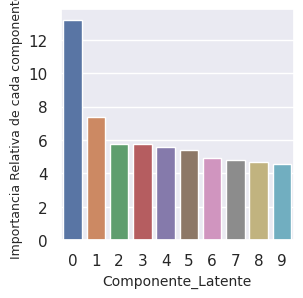

In [ ]:
# Gráfica de los Componentes Latentes de la matriz para el análisis de la importancia relativa de cada uno. 

sns.set(rc={'figure.figsize':(3,3)}) 
chart = sns.barplot(x=list(range(len(Sigma))), y = Sigma )
chart.set_xlabel('Componente_Latente', fontdict={'size': 10})
chart.set_ylabel('Importancia Relativa de cada componente', fontdict={'size': 9})
plt.show()



> Para este punto es importante recalcar que se utilizó la técnica SVD truncada, una técnica matricial que nos ayuda a reducir dimensiones y comprimir datos.

> Unas de sus características clave son que completa datos faltantes, análiza los componentes principales y eficienta el procesamiento de datos. Además nos ayuda a extraer información relevante.

> Por ejemplo, con nuestros resultados y a través de nuestra gráfica de barras podemos observar que, el componente latente 0 con mayor importancia de **13.17320472** supera en más del **55%** al siguiente componente que tiene un puntaje de: **7.37062805**. Mientras que a partir del valor singular 3 hasta el 10 evaluados entre ellos, de denotan una menor diferencia.

Entonces en este punto evaluamos el siguiente aspecto:

**Importancia Relativa vs. Componente Latente**: Los puntajes de los componentes singulares más altos representan componentes más importantes, en este caso, para **0:** 13.17320472 | **1:**7.37062805 | fueron los componentes de mayor importancia, precedidos de los sisguientes: **2:** 5.75839977 | **3:** 5.7403346 | **4:**  5.56044665 | **5:** 5.38941243 | **6:**  4.95123686 | **7:**  4.81108772 | **8:** 4.70087585 | **9:**4.55509817












### **Ejercicio 6**

**Obtener la matriz tokens-temas (*term-topic*) a partir de la matriz $V^T$ de la descomposición SVD.  Despliega sus primeros 5 renglones donde se incluya el nombre de las columnas.**  

In [ ]:
# La matriz V-transpuesta es la que genera la relación Terms(word)-Topics,
# los renglones son los términos/words y las columnas los tópicos/temas:

lsi_term_topic = V_T 

print(lsi_term_topic.shape)

(98263, 10)


In [ ]:
# rescatemos los nombres de los términos/tokens:

term_names = list(vectorizer.get_feature_names_out())

print(term_names)

['___guia_de_actuacio', '___tabla_resumen_y_ex', '__luisplanas', '_avt_', '_barallobre', '_deanfuentes', '_gafas_y_reloj_', '_la_epopeya_de_los_pilotos_de_la_rep', '_miguelhernan', '_obliga', '_vtxo', 'aaas', 'aaimlzvx', 'aaiún', 'aalla', 'aamir', 'aamma', 'aapp', 'aardman', 'aaron', 'aarron', 'aarts', 'aarón', 'abad', 'abades', 'abadeses', 'abadi', 'abadiño', 'abadía', 'abaitua', 'abajo', 'abalanza', 'abalanzamos', 'abalanzaron', 'abalanzándose', 'abalanzó', 'abalos', 'abalosmeco', 'abanca', 'abandera', 'abanderaban', 'abanderada', 'abanderadas', 'abanderado', 'abanderados', 'abanderando', 'abanderar', 'abandere', 'abanderen', 'abanderándose', 'abanderó', 'abandoibarra', 'abandona', 'abandonaba', 'abandonaban', 'abandonada', 'abandonadas', 'abandonado', 'abandonados', 'abandonament', 'abandonamos', 'abandonan', 'abandonando', 'abandonar', 'abandonara', 'abandonaran', 'abandonaremos', 'abandonarla', 'abandonarle', 'abandonarlo', 'abandonarlos', 'abandonaron', 'abandonarse', 'abandonará

In [ ]:
# Y generamos un DataFrame con la matriz term-topic:

term_topic_matrix = pd.DataFrame(data=lsi_term_topic, 
                                 index = term_names,   
                                 columns = [f'Concepto_Latente_{r}' for r in range(0,V_T.shape[1])]
                                )

print(term_topic_matrix.shape)   #  words X topics

(98263, 10)


In [ ]:
term_topic_matrix.head(5)    # los renglones son los terms/words 
                            # y las columnas los conceptos latentes o tópicos:

,Concepto_Latente_0,Concepto_Latente_1,Concepto_Latente_2,Concepto_Latente_3,Concepto_Latente_4,Concepto_Latente_5,Concepto_Latente_6,Concepto_Latente_7,Concepto_Latente_8,Concepto_Latente_9
___guia_de_actuacio,0.000137,0.000244,-0.000078,-0.000223,-0.000038,-0.000282,-0.000332,0.000394,-0.000282,-0.000230
___tabla_resumen_y_ex,0.000184,0.000232,-0.000139,-0.000382,-0.000152,-0.000268,-0.000315,0.000897,-0.000360,-0.000626
__luisplanas,0.000033,-0.000071,-0.000024,0.000053,-0.000059,-0.000003,0.000050,-0.000046,-0.000041,-0.000019
_avt_,0.000056,-0.000091,-0.000055,0.000013,-0.000041,0.000051,-0.000104,-0.000010,0.000042,-0.000151
_barallobre,0.000023,-0.000012,-0.000003,-0.000021,0.000017,0.000052,-0.000058,-0.000023,0.000018,-0.000011


Dentro del análisis de los valores singulares de la matriz, se han determinado 10 componentes latentes para el análisis de los term-topic. Con las iteraciones generadas se determinaron 10 coluumnas las cuales son el mejor valor para separar por tópicos o temas los documentos estudiados.

Los valores singulares obtenidos reflejan la factorización de los documentos tokenizados que, para el caso, han determinado dividirse en 10 grandes grupos definidos por los contextos de cada componente. Con esta información se puede determinar cual es la palabra clave o principal para cada una de las columnas generadas; dichos tokens se ordenan de mayor a menor y con su valuación se determinan la frecuencia de las palabras sumado a la temática en la que dicha palabra ha sido utilizada, reflejando el contexto de ello.

Por su parte se muestran los primeros 5 renglones que se describen con el componente latente respectivo y el score que le corresponde a cada uno. A continacuón, en los siguientes puntos se determinarán los detalles de cada componente latente para definir el tópico que recoge la información de dicha organización tales como política, educación, deportes o cualquier tema en particular.


### **Ejercicio 7 y Ejercicio 8**

**Con base a la cantidad de conceptos latentes que determinaste en el ejercicio 6 anterior, obtener  cada uno de sus gráficos con sus 10 términos/tokens más importantes.**

**Para cada uno de los 10 conceptos latentes obtenidos con la descomposición SVD del ejercicio 5,  obtener el gráfico de barras que muestre los 10 términos/tokens más importantes de cada uno de  ellos.**  

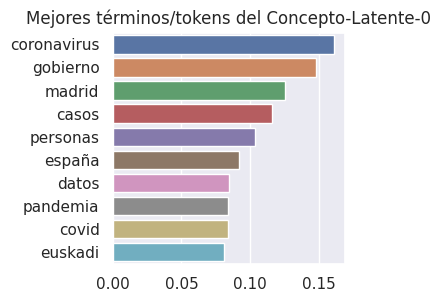

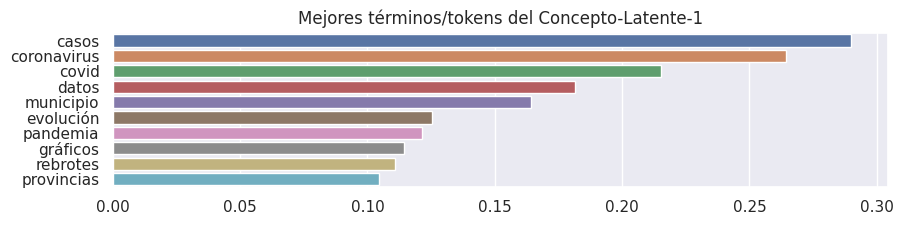

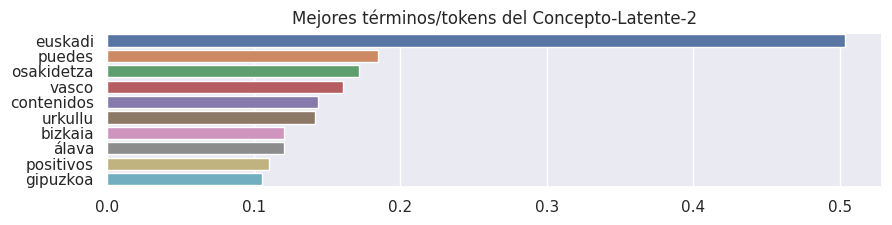

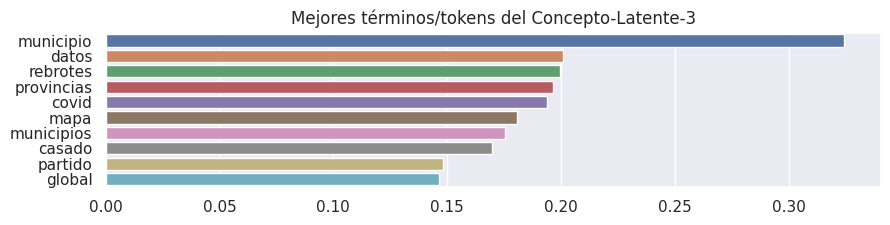

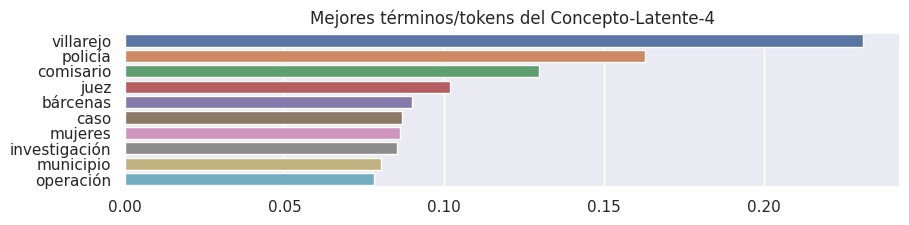

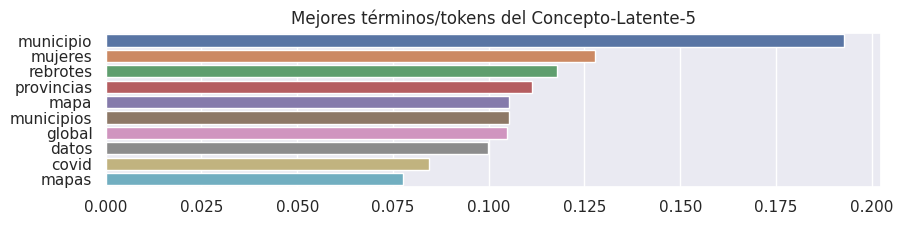

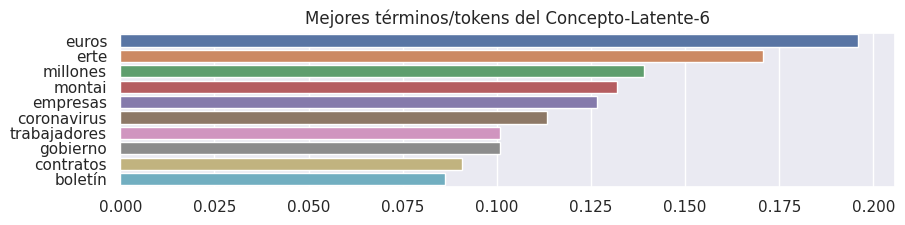

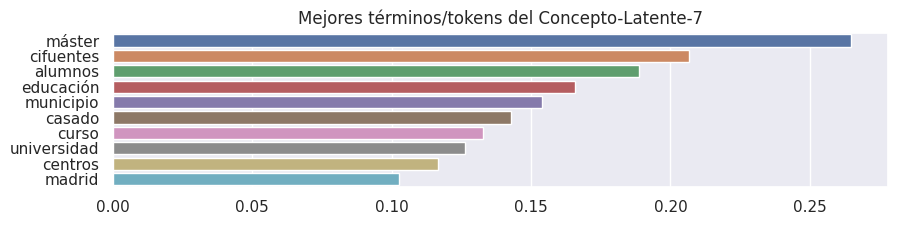

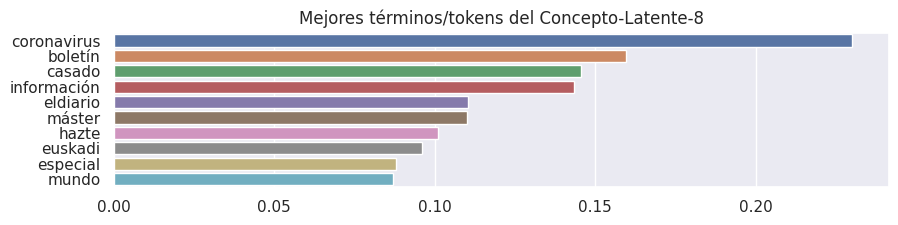

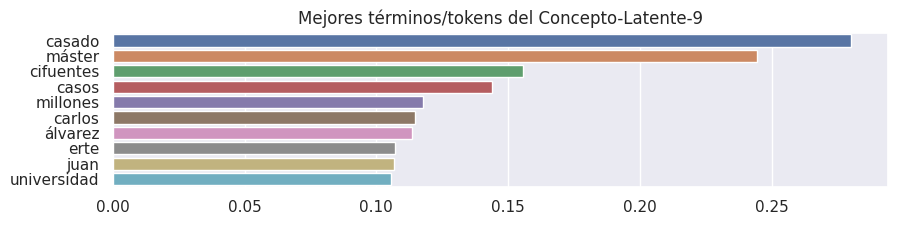

In [ ]:
# Seleccionemos por ejemplo una de las columnas/tópico "Concepto_Latente":
for i, key in enumerate(term_topic_matrix):
  data = term_topic_matrix[key]

  # ordenamos lo valores singulares de la columna/tópico de manera descendente.
  data = data.sort_values(ascending=False) # Con la opción True, visualizarás los de menor peso.    

  top_w = 10      # Define la cantidad de las mejores "top_w" términos/words a visualizar.
  top_w_matrix = data[:top_w]    # Nos quedamos con los mejores top_w pesos, asociados a 
                                # los top_w terms (words).
  
  # Se grafican cada uno de los componentes latentes reflejando las palabras top de cada uno. 
  fig, ax = plt.subplots()
  sns.set(rc={'figure.figsize':(10,2)}) 
  plt.title(f'Mejores términos/tokens del Concepto-Latente-{i}')
  fig = sns.barplot(x= top_w_matrix.values, y=top_w_matrix.index)

### **Continuación Ejercicios 7 y 8, y Ejercicio 9**

**¿Cómo describirías cada uno de dichos conceptos latentes?**

**¿Cuántos tópicos o conceptos latentes identificas
con claridad? ¿Cómo los describirías, es decir, de qué temáticas estarían hablando?**

**Con base a los resultados del ejercicio anterior, ¿cuántos tópicos o conceptos latentes identificas con claridad? ¿Cómo los describirías, es decir, de qué temáticas estarían hablando?**

*El ejercicio nos pide reallizar una descomposición SVD Truncada con 10 componentes, por lo que se esperan al menos 10 tópicos o conceptos latentes. Tras analizar los tokens del más importantes de cada uno, se identifican las siguientes temáticas:*

*Concepto Latente 0: Pandemia del COVID-19 en España*

*Concepto Latente 1: Pandemia del COVID-19 en España*

*Concepto Latente 2: País Vasco*

*Concepto Latente 3: Pandemia del COVID-19*

*Concepto Latente 4: Investigaciones Policiacas Municipales*

*Concepto Latente 5: Pandemia del COVID-19 en Mujeres de España*

*Concepto Latente 6: Economía en España*

*Concepto Latente 7: Educación Superior en España*

*Concepto Latente 8: Noticias de España*

*Concepto Latente 9: Noticias de España*

*La interpretación de estos resultados es preliminar basado en los tokens más importantes. Debido a la gran similitud de muchos de ellos, se podría estudiar la posibilidad de reducir aún más el número de tópicos agrupar los que parecen que hablan de temas similares.*

Como se puede observar, hay componentes que tienen palabras clave iguales o muy similares dentro de su contexto, sin embargo, las mismas pueden hacer parte de diferentes temas. Por ejemplo, los 2 primeros componentes hacer referencia a la pandemia del COVID 19; no obstante, el primer componente menciona madrid, euskadi, gobierno y políticas lo cual podría interpretarse como las medidas que el gobierno tomó en la regiones de euskadi y madrid durante la pandemia y los resultados que se obtuvieron a partir de dichas políticas. El segundo componente incluye palabras como rebrotes, provincias, evolución y gráficos lo cual puede indicar un contexto de entidades gubernamentales ejecutando estudios de rebrotes y evoluciones de casos del COVID19 en las provincias de España y no solamente en una región específica.

### **Ejercicio 10**

**La librería de código abierto Gensim, incluye la implementación de la técnica LSI. Ver documentación:** https://radimrehurek.com/gensim/models/lsimodel.html

**Investiga la documentación de este modelo LSI en Gensim y aplica dicha técnica a tu conjunto de datos. En particular, obtener los modelos de 2 a 10 temas/tópicos y para cada uno de ellos obtener su valor (*score*) de coherencia. Con base a dichos valores, ¿qué cantidad de tópicos sería el adecuado? ¿Coincide con lo que obtuviste previamente, usando la técnica SVD de manera directa?**  

In [ ]:
import gensim
from gensim import corpora, models
from gensim.models import LsiModel
from gensim.models.coherencemodel import CoherenceModel

In [ ]:
documents = df['texto'].tolist()

# Preprocesamos los documentos y creamos un diccionario
preprocessed_documents = [document.lower().split() for document in documents]
#dictionary = corpora.Dictionary(preprocessed_documents)

# Creamos un document-term matrix
#corpus = [dictionary.doc2bow(doc) for doc in preprocessed_documents]

preprocessed_documents[0:10]

[['españa',
  'dejado',
  'católica',
  'decía',
  'manuel',
  'azaña',
  'comienzo',
  'segunda',
  'república',
  'aquel',
  'congreso',
  'diputados',
  'aprobó',
  'leyes',
  'laicistas',
  'metáfora',
  'dejó',
  'católica',
  'papel',
  'creencias',
  'buena',
  'parte',
  'pueblo',
  'migración',
  'integración',
  'europea',
  'programa',
  'europa',
  'saber',
  'españa',
  'domingo',
  'noviembre',
  'dejado',
  'excepción',
  'europa',
  'potencia',
  'extrema',
  'derecha',
  'parlamento',
  'metáfora',
  'pues',
  'precisamente',
  'excepcional',
  'tener',
  'dictadura',
  'mediados',
  'setenta',
  'dictador',
  'mausoleo',
  'después',
  'años',
  'muerto',
  'existía',
  'cosa',
  'portugal',
  'grecia',
  'italia',
  'alemania',
  'países',
  'dictaduras',
  'fascistas',
  'españa',
  'pasó',
  'portugal',
  'italia',
  'alemania',
  'derrotó',
  'fascismo',
  'franquismo',
  'murió',
  'cama',
  'harakiri',
  'cortes',
  'franquistas',
  'ruptura',
  'régimen',
  'si

In [ ]:
# Convertimos el DataFrame a una lista de strings
documents = df['texto'].tolist()

# Partimos la lista de strings a una lista de lista de tokens
docs = [document.lower().split() for document in documents]

# Generamos el diccionario
mi_dicc = corpora.Dictionary(docs)

# Generamos la Bag of Words
bow = [mi_dicc.doc2bow(doc) for doc in docs]

In [ ]:
for i in range(2,9):
    
    lsi = LsiModel(bow,
                   num_topics=i, 
                   id2word=mi_dicc,
                   chunksize=1024,
                   random_seed=42
                  ) 
        
    
    cm = CoherenceModel(model=lsi, 
                        texts=docs, 
                        dictionary=mi_dicc, 
                        window_size=3,
                        coherence='c_v',
                        topn = 3
                       )
    
    cs = cm.get_coherence()
    
    print('Métrica de Coherencia con {} clusters: {}'.format(i, cs))

Métrica de Coherencia con 2 clusters: 0.4929443733965374
Métrica de Coherencia con 3 clusters: 0.5786835414469573
Métrica de Coherencia con 4 clusters: 0.5954451155276723
Métrica de Coherencia con 5 clusters: 0.5841901290569684
Métrica de Coherencia con 6 clusters: 0.6114187929039164
Métrica de Coherencia con 7 clusters: 0.6511263018879621
Métrica de Coherencia con 8 clusters: 0.5380650038686814


In [ ]:
# Seleccionas el mejor de los anteriores:

lsi = LsiModel(bow, 
               num_topics=3, 
               id2word=mi_dicc,
               chunksize=512,
               random_seed=26
               )

# Veamos la manera en que se distribuyen los términos en cada tópico generado:
for topic_num, words in lsi.print_topics(num_words=4):
    print('Tokens/Words in Topic {}: {}.'.format(topic_num, words))

Tokens/Words in Topic 0: 0.229*"gobierno" + 0.172*"coronavirus" + 0.165*"personas" + 0.144*"años".
Tokens/Words in Topic 1: -0.263*"casos" + -0.250*"coronavirus" + 0.187*"gobierno" + 0.181*"partido".
Tokens/Words in Topic 2: -0.430*"casos" + 0.182*"volver" + -0.179*"número" + -0.175*"cada".


**`Con base a dichos valores, ¿qué cantidad de tópicos sería el adecuado? ¿Coincide con lo que obtuviste previamente, usando la técnica SVD de manera directa?`**

De acuerdo a lo que determinó el modelo se encuentra apenas 7 métricas de Coherencia la cual dista de los 10 Componentes Latentes que se han determinado en el modelo de SVD. LO anterior señala que bajo este modelo se han logrado agrupar más palabras dentro de un contexto similar aunque, como previamente se destacaba, se enfocaran en temáticas distintas pero relacionadas entre sí por las palabras clave que utilizaban y el origen de las mismas.

El modelo Gensim (LSI) contiene varios algoritmos para la descomposición de grandes corpus, una combinación de los cuales permite construir modelos LSI de manera efectiva y transparente. Este módulo contiene varias funcionalidades en el procesamiento de lenguaje dado que corpus mucho más grandes que ayuda a procesar más información inclusive con más idiomas y varios contextos.

# **Parte 2: Asignación de Dirichlet Latente (LDA):**

### **Ejercicio 11**

**Utiliza la librería Gensim para implementar ahora la técnica de LDA. Revisa la documentación correspondiente y aplica de preferencia el modelo paralelizable:**

https://radimrehurek.com/gensim/models/ldamodel.html

https://radimrehurek.com/gensim/models/ldamulticore.html

In [ ]:
# Los documentos a analizar:
docs

# Generamos el diccionario:
id2word = corpora.Dictionary(docs)

for id in range(7):
    print(id2word[id])

abascal
abril
actores
ahora
alemanes
alemania
alianza


In [ ]:
# Generamos el corpus con las tuplas (índice, frecuencia):

corpus = [id2word.doc2bow(doc) for doc in docs]
corpus

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 2),
  (5, 2),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 5),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 2),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 2),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 2),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 3),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 7),
  (44, 1),
  (45, 1),
  (46, 2),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 2),
  (58, 2),
  (59, 2),
  (60, 1),
  (61, 1),
  (62, 7),
  (63, 1),
  (64, 1),
  (65, 4),
  (66, 4),
  (67, 3),
  (68, 2),
  (69, 1),
  (70, 1),
  (71, 2),
  (72, 1),
  (73, 1),
  (74, 7),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 2),
  (82, 1),
  (83, 4),
  (84, 1),
  (85, 1),
  (86, 2),
  (87, 1),
  (88, 1),
  (89, 1),
  (90, 2),
  (91, 1)

In [ ]:
# Siempre podemos expresar cada documento con palabras para un mejor entendimiento:
[[(id2word[id], fre) for id, fre in cor] for cor in corpus[:2]]

[[('abascal', 1),
  ('abril', 1),
  ('actores', 1),
  ('ahora', 1),
  ('alemanes', 2),
  ('alemania', 2),
  ('alianza', 1),
  ('amigos', 1),
  ('amplio', 1),
  ('apresurado', 1),
  ('aprobó', 1),
  ('aquel', 1),
  ('aunque', 5),
  ('aurora', 1),
  ('austriaca', 1),
  ('autonómicos', 1),
  ('azaña', 1),
  ('años', 2),
  ('bastantes', 1),
  ('bebiera', 1),
  ('blas', 1),
  ('buena', 1),
  ('búnker', 1),
  ('cama', 1),
  ('catalunya', 1),
  ('católica', 2),
  ('cierto', 1),
  ('ciudadanos', 1),
  ('clásicos', 1),
  ('comienzo', 1),
  ('congreso', 1),
  ('cortes', 1),
  ('cosa', 1),
  ('creencias', 1),
  ('crisis', 2),
  ('cuyo', 1),
  ('debajo', 1),
  ('decía', 1),
  ('deja', 1),
  ('dejado', 3),
  ('dejó', 1),
  ('democrática', 1),
  ('demócratas', 1),
  ('derecha', 7),
  ('derrotó', 1),
  ('despeñarse', 1),
  ('después', 2),
  ('dictador', 1),
  ('dictadura', 1),
  ('dictaduras', 1),
  ('diputados', 1),
  ('domingo', 1),
  ('dorada', 1),
  ('duplica', 1),
  ('décimas', 1),
  ('efecto', 

In [ ]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                    id2word=id2word,
                    num_topics=4,       # total de tópicos que deseas buscar...
                    chunksize=10,        # número de documentos a analizar en cada chunk de entrenamiento
                    passes=10,          # número de pasadas al corpus durante el entrenamiento.
                    alpha=0.2,          # alfa: similaridad document-topics
                    eta=0.2,            # beta: similaridad topic-words      
                    )

In [ ]:
lda_model.print_topics(num_topics=4, num_words=4)

[(0, '0.010*"euskadi" + 0.008*"euros" + 0.007*"vasco" + 0.007*"millones"'),
 (1,
  '0.006*"coronavirus" + 0.006*"personas" + 0.005*"casos" + 0.005*"españa"'),
 (2, '0.007*"años" + 0.004*"puede" + 0.004*"solo" + 0.004*"vida"'),
 (3,
  '0.012*"gobierno" + 0.007*"política" + 0.007*"podemos" + 0.007*"partido"')]

### **Ejercicio 12**

**Con base a esta técnica,**
- **¿qué cantidad de tópicos consideras que es la más adecuada?**

**Compara tus resultados con el método LSI.**
- **¿Qué encuentras de coincidencias y diferencias?**
- **¿Cuál consideras puede ser el mejor resultado, es decir, cuál consideras puede ser la mejor cantidad de tópicos a considerar?**

El LDA es un modelo generativo que permite que conjuntos de observaciones puedan ser explicados por grupos no observados que explican por qué algunas partes de los datos son similares. Por ejemplo, si las observaciones son palabras en documentos, presupone que cada documento es una mezcla de un pequeño número de categorías (también denominados tópicos) y la aparición de cada palabra en un documento se debe a una de las categorías a las que el documento pertenece.

En LDA, cada documento puede verse como una mezcla de varias categorías. En la práctica, esto resulta en mezclas de categorías en un documento más razonables. La clave en LDA es que las palabras siguen una hipótesis de bolsa de palabras o, más bien que el orden no importa, que el uso de una palabra es ser parte de un tema y que comunica la misma información sin importar dónde se encuentra en el documento.

Dentro de lo anterior se observó que se tiene una menor cantidad de tópicos o temas con respecto a los modelos anteriores dado que el LDA presupone que documentos con tópicos o temáticas similares emplearán palabras similares.
Los documentos están compuestos por un conjunto de tópicos que siguen una determinada distribución. Los tópicos están compuestos por un conjunto de palabras que, al igual que estos, siguen una determinada distribución.

Si bien una menor cantidad de tópicos o temas a considerar podría suponer un mejor desempeño a nivel de máquina, menor cantidad de recursos para el análisis de las variables involucradas al igual que la ejecución del aprendizaje del modelo, dicha información puede perderse o mezclarse con otro tipo de contexto que perderá otro tipo de conextos que pueden ser relevantes en otros estudios y extraviar temas que pueden describir entornos distintos.


### **Ejercicio 13**

**La librería pyLDAvis nos ayuda a visualizar de manera interactiva los temas y tokens de los documentos analizados. Revisa la documentación y utilízala para visualizar tus mejor resultado.**

https://pypi.org/project/pyLDAvis/  

In [ ]:
!pip install --upgrade pip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install ipykernel==5.5.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install --upgrade pip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install --upgrade pandas

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pyLDAvis.gensim_models

In [ ]:
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel

import gensim
import pyLDAvis
import pyLDAvis.gensim_models
import pyLDAvis.gensim_models as gensimvis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
!pip install --upgrade pyLDAvis gensim

In [ ]:
pyLDAvis.enable_notebook()
p = gensimvis.prepare(lda_model, corpus, id2word)

p

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.102399 -0.061506       1        1  40.469798
3     -0.105865 -0.210870       2        1  25.397894
2     -0.120706  0.262913       3        1  25.046142
0      0.328970  0.009463       4        1   9.086166, topic_info=             Term          Freq         Total Category  logprob  loglift
425      gobierno  12037.000000  12037.000000  Default  30.0000  30.0000
557      política   4611.000000   4611.000000  Default  29.0000  29.0000
1889        euros   4569.000000   4569.000000  Default  28.0000  28.0000
309   coronavirus   6216.000000   6216.000000  Default  27.0000  27.0000
145       partido   4077.000000   4077.000000  Default  26.0000  26.0000
...           ...           ...           ...      ...      ...      ...
198          tras    696.451620   4309.845251   Topic4  -5.7676   0.5758
144         parte    695.518893   6214.063339   Topic4  -5.7689   0.2085
149          país    630.670086   3949.534132   Topic4  -5.8668   0.5638
180       segunda    548.217530   1166.902904   Topic4  -6.0069   1.6430
17           años    545.299058   7706.178493   Topic4  -6.0122  -0.2500

[266 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1850      1  0.999556  actividad
1451      1  0.316175    acuerdo
1451      2  0.683491    acuerdo
705       1  0.619187     además
705       2  0.213621     además
...     ...       ...        ...
1450      2  0.999635    álvarez
5048      1  0.061717      éxito
5048      3  0.936783      éxito
205       1  0.986155    últimas
205       2  0.013788    últimas

[393 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 4, 3, 1])

### **Ejercicio 14**

El modelado de tópicos es una técnica dentro del campo del NLP, que permite descubrir y comprender las temáticas subyacentes en una colección de documentos. El propósito central de este método es reducir un conjunto de documentos en un marco de datos discretos, usualmente mediante una representación en vectores de dichos documentos, donde cada uno corresponde a un conteo de palabras. Una de las suposiciones básicas del modelado de tópicos es que cada documento es una mezcla aleatoria de temáticas y estas, una mezcla de palabras (Kherwa., & Bansal, 2018).

Uno de los modelos algebraicos mediante los cuales se representa un conjunto de documentos (corpus) es el de la frecuencia de término - frecuencia inversa de documento (tf − idf). La premisa de este modelo es que cuanto mayor sea la frecuencia de un término en un documento, más relevante va a ser dicho término para la definición de la temática del respectivo documento (𝑡𝑓).

En complemento, la 𝑖𝑑𝑓 establece que, si un término aparece con mucha frecuencia en muchos documentos, menor será el valor discriminativo de dicho término para la definición de un tópico latente (Asmussen & Møller, 2019).
En esta etapa se realiza la limpieza del corpus y se aplican los procesos de reducción del vocabulario (lematización, stemming, eliminación de stopwords y tokenización).

Posteriormente se redujeron la cantidad de frases y palabras para su análisis dado que se descartaron elementos nada relevantes. Luego se determinó la matriz Tf-idf con la cual se organizó la información de las noticias, determinando en principio la relevancia de ciertos datos. Cada renglón representaba cada uno de los documentos analizados y las columnas representaban todos los tokens del diccionario generado por el método TfidVectorizer. 

Los valores obtenidos en las columnas de cada renglón mostraron la importancia que tenía cada token en el documento con relación a la frecuencia total de aparición en todos los documentos analizados. En este caso, para mayor facilidad, se ordenó cada reglón para que se desplegaran sólo las columnas que contienen los 5 tokens de mayor importancia de los primeros 5 documentos.

Implementando el método de descomposición de valores singulares truncado a la matriz Tf-idf con el cual se consideraron 10 valores singulares a considerar cuyos procesos describen el tipo de temas o tópicos que estaban involucrados en el documento analizado. Si bien el modelo mostró varios tipos de contextos diferentes entre sí, se encontraron algunos que podría ser similares a otros llegando incluso a compartir palabras clave que generan redundancia entre los tópicos.

Para esto punto, dependiendo del análisis desarrollado, la cantidad de valores singulares podría reducirse con el fin de tener únicamente contexto distintos y tópicos que no generen reiteración o demasía en su procesamiento. Al momento de graficar la información es visible la granularidad de las palabras clave dentro de cada contexto las cuales, en general, no sobrepasan un 30% de relevancia dentro de cada tópico, con algunas excepciones que si llegan incluso al 50% dentro de su nicho.

En cuanto a los modelos LSI y LDA se observó una reducción en la cantidad de contextos o tópicos que se obtienen en el análisis del documento. Estos módulos contienen incorporados corpus en sus procesamientos facilitando el análisis de los componentes o conjuntos de datps que ayudan a reducir el tamaño de las observaciones, limitando la cantidad de contextos o tópicos involucrados. 
Lo anterior permitió obtener tópicos más independientes que acumularan la información de palabras claves en un solo contexto, evitando redundancia o repetición de los mismos elementos.

El modelo de tópicos o temas en particular es un elemento relevante en el procesamiento de lenguaje dado que ayuda en el análisis y direccionamiento de las palabras claves o llamativas dentro de un contexto en particular, el cual puede verse afectado o influenciado por dichas interacciones.


**Bibliografía**


>* Asmussen, C. B., & Møller, C. (2019). Smart literature review: a practical topic modelling approach to exploratory literature review. Journal of Big Data, 6(1), 1-18. https://doi.org/10.1186/s40537-019-0255-7

>* Asuncion, A., Welling, M., Smyth, P., & Teh, Y. W. (2009). On smoothing and inference for topic models. Proceedings of the 25th Conference on Uncertainty in Artificial Intelligence, UAI 2009. (pp. 25-36)

>* Kherwa, P., & Bansal, P. (2018). Topic Modeling: A Comprehensive Review. ICST Transactions on Scalable Information Systems, 7(24). https://doi.org/10.4108/eai.13-7-2018.159623

>* Kowsari, K., Jafari-Meimandi, K., Heidarysafa, M., Mendu, S., Barnes, L., & Brown, D. (2019). Text classification algorithms: A survey. Information, 10(4). https://doi.org/10.3390/info10040150
